In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score
import pandas as pd

# Загрузка данных
data_class = pd.read_csv('2dataset.csv')
y = data_class['RainTomorrow']
X = data_class.drop(['RainTomorrow', 'Date', 'Location'], axis=1)

# Разделение данных на обучающую и тестовую выборки (80% - train, 20% - test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Список значений max_depth для проверки
depths = range(1, 6)
best_depth = 0
best_score = 0

# Подбор max_depth
for depth in depths:
    clf = DecisionTreeClassifier(random_state=42, max_depth=depth)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    print(f"max_depth={depth}, Accuracy={score:.4f}")
    if score > best_score:
        best_score = score
        best_depth = depth

print(f"Лучший max_depth (hold-out): {best_depth}, Accuracy: {best_score:.4f}")

max_depth=1, Accuracy=0.8544
max_depth=2, Accuracy=0.8558
max_depth=3, Accuracy=0.8570
max_depth=4, Accuracy=0.8616
max_depth=5, Accuracy=0.8633
Лучший max_depth (hold-out): 5, Accuracy: 0.8633


In [55]:
from sklearn import tree

text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_12 <= 0.77
|   |--- feature_12 <= 0.61
|   |   |--- feature_14 <= 0.50
|   |   |   |--- feature_4 <= 0.49
|   |   |   |   |--- feature_14 <= 0.35
|   |   |   |   |   |--- class: True
|   |   |   |   |--- feature_14 >  0.35
|   |   |   |   |   |--- class: False
|   |   |   |--- feature_4 >  0.49
|   |   |   |   |--- feature_12 <= 0.42
|   |   |   |   |   |--- class: False
|   |   |   |   |--- feature_12 >  0.42
|   |   |   |   |   |--- class: False
|   |   |--- feature_14 >  0.50
|   |   |   |--- feature_4 <= 0.44
|   |   |   |   |--- feature_14 <= 0.61
|   |   |   |   |   |--- class: False
|   |   |   |   |--- feature_14 >  0.61
|   |   |   |   |   |--- class: False
|   |   |   |--- feature_4 >  0.44
|   |   |   |   |--- feature_12 <= 0.50
|   |   |   |   |   |--- class: False
|   |   |   |   |--- feature_12 >  0.50
|   |   |   |   |   |--- class: False
|   |--- feature_12 >  0.61
|   |   |--- feature_6 <= 0.31
|   |   |   |--- feature_4 <= 0.44
|   |   |   |   |--- featur

In [56]:
from matplotlib import pyplot as plt
from sklearn import tree

# Создаём фигуру с большим размером
fig = plt.figure(figsize=(30, 25), dpi=300)  # Увеличиваем размер и разрешение

# Рисуем дерево с настройками
_ = tree.plot_tree(
    clf,
    feature_names=X.columns,
    class_names=[str(label) for label in y.unique()],
    filled=True,
    fontsize=10,  # Увеличиваем шрифт
    rounded=True,  # Закругляем углы для красоты
    proportion=False,  # Показываем абсолютные значения, а не пропорции
    precision=2,  # Ограничиваем количество знаков после запятой
)

plt.tight_layout()

plt.show()

In [37]:
from sklearn.ensemble import BaggingClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
models = [
    (
        'BaggingClassifier',
        BaggingClassifier(
            estimator=DecisionTreeClassifier(max_depth=3),
            n_estimators=50,
            max_samples=0.8,
            max_features=0.8,
            bootstrap=True,
            bootstrap_features=False,
            n_jobs=-1,
            random_state=42
        )
    ),
    (
        'GradientBoostingClassifier',
        GradientBoostingClassifier(
            learning_rate=0.1,
            n_estimators=100,
            subsample=0.8,
            criterion='friedman_mse',
            min_samples_split=5,
            min_samples_leaf=2,
            max_depth=3,
            random_state=42,
            max_features='sqrt'
        )
    ),
    (
        'StackingClassifier',
        StackingClassifier(
            estimators=[
                ('lr', LogisticRegression()),
                ('dt', DecisionTreeClassifier(max_depth=3, random_state=42))
            ],
            final_estimator=LogisticRegression(),
            cv=5,
            n_jobs=-1,
            passthrough=False
        )
    )
]

In [38]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate, cross_val_predict
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.combine import SMOTETomek

def pipeline_cross_classification(model, X, y, kf):
    pipeline = ImbPipeline([
        ('scaler', StandardScaler()),
        ('smt', SMOTETomek(random_state=42)),
        ('classifier', model)
    ])
    scoring = {
        'accuracy': 'accuracy',
        'precision': 'precision',
        'recall': 'recall',
        'f1': 'f1',
        'roc_auc': 'roc_auc'
    }
    cv_results = cross_validate(
        pipeline, X, y, cv=kf, scoring=scoring, return_train_score=True, n_jobs=-1
    )
    y_pred = cross_val_predict(pipeline, X, y, cv=kf, method='predict', n_jobs=-1)
    if hasattr(model, 'predict_proba'):
        y_proba = cross_val_predict(pipeline, X, y, cv=kf, method='predict_proba', n_jobs=-1)[:, 1]
    else:
        y_proba = cross_val_predict(pipeline, X, y, cv=kf, method='decision_function', n_jobs=-1)
    return pipeline, cv_results, y_proba, y_pred


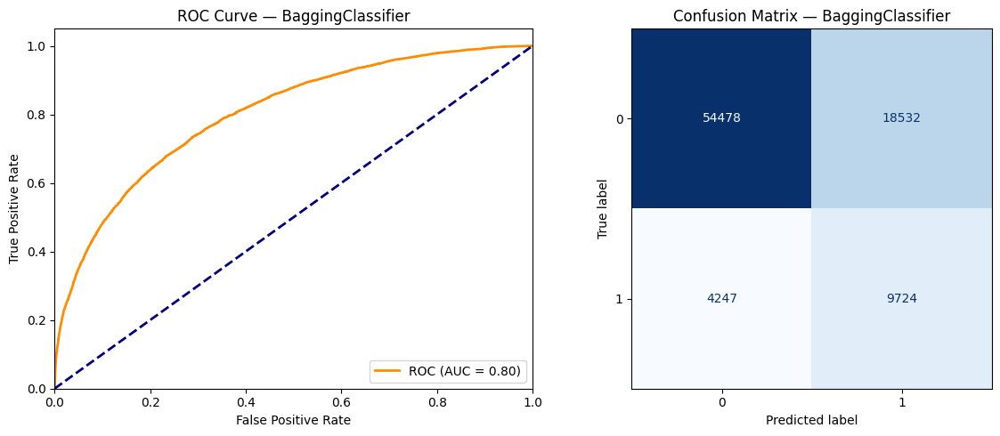

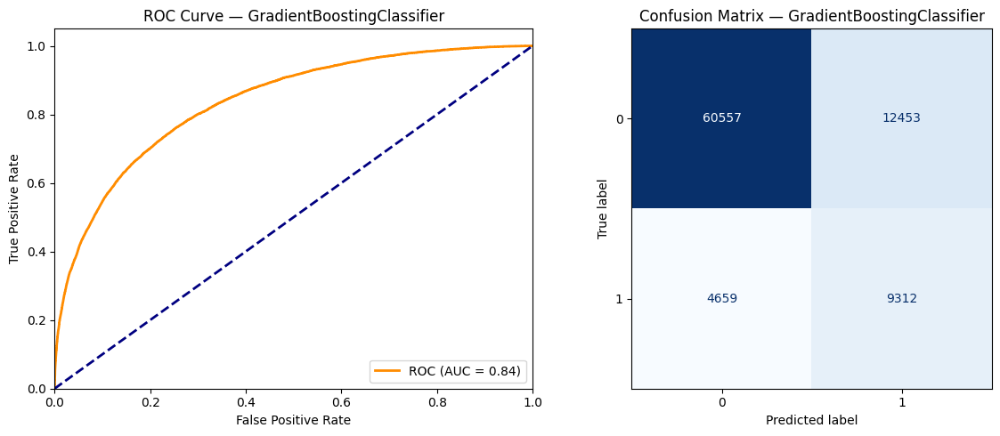

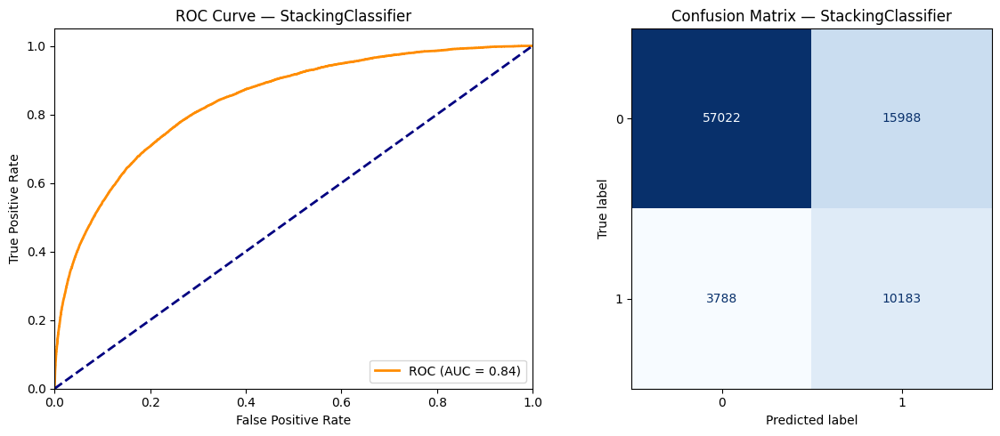

In [39]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for model_name, model in models:
    # Обучение модели с кросс-валидацией
    pipeline, cv_results, y_proba, y_pred = pipeline_cross_classification(model, X, y, kf)


    pipeline.fit(X, y)  # Обучить пайплайн
    trained_model = pipeline.named_steps['classifier']

    # Визуализация: ROC + Confusion Matrix
    plt.figure(figsize=(12, 5))

    # --- ROC Curve ---
    plt.subplot(1, 2, 1)
    fpr, tpr, _ = roc_curve(y, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve — {model_name}')
    plt.legend(loc="lower right")

    # --- Confusion Matrix ---
    plt.subplot(1, 2, 2)
    cm = confusion_matrix(y, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['0', '1'])
    disp.plot(cmap='Blues', ax=plt.gca(), colorbar=False, values_format='d')
    plt.title(f'Confusion Matrix — {model_name}')

    plt.tight_layout()
    plt.show()

In [40]:
from sklearn.model_selection import cross_val_score
import numpy as np

# Загрузка данных
data_class = pd.read_csv('2dataset.csv')
y = data_class['RainTomorrow']
X = data_class.drop(['RainTomorrow', 'Date', 'Location'], axis=1)

# Список значений max_depth для проверки
depths = range(1, 6)
best_depth = 0
best_score = 0

# Подбор max_depth с использованием k-fold (k=5)
for depth in depths:
    clf = DecisionTreeClassifier(max_depth=depth, random_state=42)
    # Выполняем 5-fold кросс-валидацию
    scores = cross_val_score(clf, X, y, cv=5, scoring='accuracy')
    mean_score = np.mean(scores)
    print(f"max_depth={depth}, Mean Accuracy={mean_score:.4f}")
    if mean_score > best_score:
        best_score = mean_score
        best_depth = depth

print(f"Лучший max_depth (k-fold): {best_depth}, Mean Accuracy: {best_score:.4f}")

max_depth=1, Mean Accuracy=0.8489
max_depth=2, Mean Accuracy=0.8573
max_depth=3, Mean Accuracy=0.8575
max_depth=4, Mean Accuracy=0.8596
max_depth=5, Mean Accuracy=0.8599
Лучший max_depth (k-fold): 5, Mean Accuracy: 0.8599


In [41]:
clf = DecisionTreeClassifier(max_depth=best_depth, random_state=42)
clf.fit(X, y)

text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_12 <= 0.75
|   |--- feature_12 <= 0.58
|   |   |--- feature_14 <= 0.50
|   |   |   |--- feature_4 <= 0.49
|   |   |   |   |--- feature_14 <= 0.35
|   |   |   |   |   |--- class: True
|   |   |   |   |--- feature_14 >  0.35
|   |   |   |   |   |--- class: False
|   |   |   |--- feature_4 >  0.49
|   |   |   |   |--- feature_12 <= 0.42
|   |   |   |   |   |--- class: False
|   |   |   |   |--- feature_12 >  0.42
|   |   |   |   |   |--- class: False
|   |   |--- feature_14 >  0.50
|   |   |   |--- feature_4 <= 0.46
|   |   |   |   |--- feature_14 <= 0.61
|   |   |   |   |   |--- class: False
|   |   |   |   |--- feature_14 >  0.61
|   |   |   |   |   |--- class: False
|   |   |   |--- feature_4 >  0.46
|   |   |   |   |--- feature_12 <= 0.50
|   |   |   |   |   |--- class: False
|   |   |   |   |--- feature_12 >  0.50
|   |   |   |   |   |--- class: False
|   |--- feature_12 >  0.58
|   |   |--- feature_14 <= 0.55
|   |   |   |--- feature_18 <= 0.49
|   |   |   |   |--- feat

In [42]:
from matplotlib import pyplot as plt
from sklearn import tree

# Создаём фигуру с большим размером
fig = plt.figure(figsize=(30, 25), dpi=300)  # Увеличиваем размер и разрешение

# Рисуем дерево с настройками
_ = tree.plot_tree(
    clf,
    feature_names=X.columns,
    class_names=[str(label) for label in y.unique()],
    filled=True,
    fontsize=10,  
    rounded=True,
    proportion=False,
    precision=2,
)

plt.tight_layout()

plt.show()

In [43]:
from sklearn.ensemble import BaggingRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

models = [
    (
        'BaggingRegressor',
        BaggingRegressor(
            estimator=DecisionTreeRegressor(max_depth=5),  # Базовая модель — дерево решений глубиной 5
            n_estimators=50,  # Количество деревьев в ансамбле (чем больше, тем устойчивее результат)
            max_samples=0.8,  # Доля данных, используемых для обучения каждого базового элемента (уменьшает переобучение)
            max_features=0.8,  # Доля признаков, используемых для каждого дерева (добавляет случайности)
            bootstrap=True,   # Использовать бутстрэп-выборки (True по умолчанию)
            bootstrap_features=False,  # Не использовать бутстрэп по признакам
            n_jobs=-1,        # Использовать все доступные ядра CPU для ускорения
            random_state=42   # Фиксируем случайность для воспроизводимости
        )
    ),
    (
        'GradientBoostingRegressor',
        GradientBoostingRegressor(
            loss='squared_error',  # Функция потерь: MSE
            learning_rate=0.1,     # Скорость обучения — шаг градиентного спуска (меньше — дольше обучается, но точнее)
            n_estimators=50,      # Количество деревьев (итераций) — больше => лучше качество, но дольше обучение
            subsample=0.8,         # Доля данных для обучения каждого дерева (Stochastic Boosting)
            criterion='friedman_mse',  # Критерий разбиения узлов
            min_samples_split=5,   # Минимальное число образцов для разделения узла
            min_samples_leaf=2,    # Минимальное число образцов в листе
            min_weight_fraction_leaf=0.,  # Минимальная доля весов в листе (для взвешенных выборок)
            max_depth=5,           # Максимальная глубина дерева (ограничивает сложность модели)
            min_impurity_decrease=0.,  # Минимальное уменьшение примеси для разбиения
            init=None,             # Начальная модель или константа (по умолчанию — среднее значение)
            random_state=42,       # Фиксируем случайность
            max_features='sqrt',   # Число признаков на каждом разделении: sqrt(n_features)
            alpha=0.9,             # Параметр для Huber loss и Quantile loss (если используется)
            verbose=0              # Не выводить детали обучения
        )
    ),
    (
        'StackingRegressor',
        StackingRegressor(
            estimators=[
                ('lr', LinearRegression()),  # Первая базовая модель — линейная регрессия
                ('dt', DecisionTreeRegressor(max_depth=5, random_state=42))  # Вторая модель — дерево решений
            ],
            final_estimator=LinearRegression(),  # Мета-модель, которая объединяет предсказания базовых
            cv=5,                      # Количество фолдов для кросс-валидации при обучении мета-модели
            passthrough=False,         # Не передавать исходные признаки в финальную модель
            n_jobs=-1                # Использовать все ядра процессора
        )
    )
]

In [44]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd

# Загрузка данных
data_reg = pd.read_csv('1dataset.csv')
y = data_reg['price']
X = data_reg.drop(['price'], axis=1)

# Разделение данных на обучающую и тестовую выборки (80% - train, 20% - test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Список значений max_depth для проверки
depths = range(1, 6)
best_depth = 0
best_mse = float('inf')

# Подбор max_depth
for depth in depths:
    reg = DecisionTreeRegressor(max_depth=depth, random_state=42)
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    print(f"max_depth={depth}, MSE={mse:.4f}")
    if mse < best_mse:
        best_mse = mse
        best_depth = depth

print(f"Лучший max_depth (hold-out): {best_depth}, MSE: {best_mse:.4f}")

max_depth=1, MSE=1539177.0645
max_depth=2, MSE=927725.7212
max_depth=3, MSE=589712.8613
max_depth=4, MSE=428015.0836
max_depth=5, MSE=314854.1660
Лучший max_depth (hold-out): 5, MSE: 314854.1660


In [45]:
text_representation = tree.export_text(reg)
print(text_representation)

|--- feature_0 <= 0.14
|   |--- feature_6 <= 0.47
|   |   |--- feature_6 <= 0.44
|   |   |   |--- feature_6 <= 0.41
|   |   |   |   |--- feature_3 <= 5.50
|   |   |   |   |   |--- value: [609.18]
|   |   |   |   |--- feature_3 >  5.50
|   |   |   |   |   |--- value: [766.90]
|   |   |   |--- feature_6 >  0.41
|   |   |   |   |--- feature_3 <= 4.50
|   |   |   |   |   |--- value: [732.96]
|   |   |   |   |--- feature_3 >  4.50
|   |   |   |   |   |--- value: [943.32]
|   |   |--- feature_6 >  0.44
|   |   |   |--- feature_9 <= 0.00
|   |   |   |   |--- feature_3 <= 4.50
|   |   |   |   |   |--- value: [923.67]
|   |   |   |   |--- feature_3 >  4.50
|   |   |   |   |   |--- value: [1195.91]
|   |   |   |--- feature_9 >  0.00
|   |   |   |   |--- feature_3 <= 2.50
|   |   |   |   |   |--- value: [1214.60]
|   |   |   |   |--- feature_3 >  2.50
|   |   |   |   |   |--- value: [1655.24]
|   |--- feature_6 >  0.47
|   |   |--- feature_7 <= 0.09
|   |   |   |--- feature_3 <= 4.50
|   |   |   

In [46]:
from matplotlib import pyplot as plt
from sklearn import tree

# Создаём фигуру с большим размером
fig = plt.figure(figsize=(30, 25), dpi=300)  # Увеличиваем размер и разрешение

# Рисуем дерево с настройками
_ = tree.plot_tree(
    reg,
    feature_names=X.columns,
    class_names=[str(label) for label in y.unique()],
    filled=True,
    fontsize=10,  # Увеличиваем шрифт
    rounded=True,  # Закругляем углы для красоты
    proportion=False,  # Показываем абсолютные значения, а не пропорции
    precision=2,  # Ограничиваем количество знаков после запятой
)

plt.tight_layout()

plt.show()

In [47]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
for model_name, model in models:
    # Обучение
    model.fit(X_train, y_train)

    # Предсказания
    y_pred_test = model.predict(X_test)

    fig = plt.figure(figsize=(20, 10))

    if model_name == 'BaggingRegressor': 
        print('BaggingRegressor')
        print(mean_squared_error(y_test, y_pred_test))
        print(mean_absolute_error (y_test, y_pred_test))
        print(mean_absolute_percentage_error (y_test, y_pred_test))
        print(r2_score (y_test, y_pred_test))
        print('\n')

    elif model_name == 'GradientBoostingRegressor':
        print('GradientBoostingRegressor')
        print(mean_squared_error(y_test, y_pred_test))
        print(mean_absolute_error (y_test, y_pred_test))
        print(mean_absolute_percentage_error (y_test, y_pred_test))
        print(r2_score (y_test, y_pred_test))
        print('\n')

    elif model_name == 'StackingRegressor':
        print('StackingRegressor')
        print(mean_squared_error(y_test, y_pred_test))
        print(mean_absolute_error (y_test, y_pred_test))
        print(mean_absolute_percentage_error (y_test, y_pred_test))
        print(r2_score (y_test, y_pred_test))
        print('\n')



BaggingRegressor
269955.0892819123
330.75547245243206
0.14188586417902524
0.9519455713066886


GradientBoostingRegressor
126897.97416200662
219.81250274481425
0.09315742865071502
0.9774110217113717


StackingRegressor
284193.98603623686
334.0370272900374
0.13826896982800152
0.9494109198927358




<Figure size 2000x1000 with 0 Axes>

<Figure size 2000x1000 with 0 Axes>

<Figure size 2000x1000 with 0 Axes>

In [48]:
import catboost
import xgboost
import lightgbm

models = [
    (
        'CatBoostRegressor',
        catboost.CatBoostRegressor(
            iterations=100,           # Больше итераций для лучшей сходимости
            depth=6,                  # Глубина деревьев
            learning_rate=0.1,        # Скорость обучения
            l2_leaf_reg=3,            # Регуляризация
            random_strength=1,        # Разброс случайности (для регуляризации)
            bagging_temperature=1,    # Температура бэггинга (меньше — мягче)
            verbose=0,                # Не выводить процесс обучения
            random_state=42           # Фиксированный seed
        )
    ),
    (
        'XGBRegressor',
        xgboost.XGBRegressor(
            n_estimators=100,         # Количество деревьев
            max_depth=5,              # Максимальная глубина дерева
            learning_rate=0.1,        # Скорость обучения
            subsample=0.8,            # Доля выборки для обучения каждого дерева
            colsample_bytree=0.8,     # Доля признаков для построения дерева
            reg_alpha=0.1,            # L1-регуляризация
            reg_lambda=1,             # L2-регуляризация
            random_state=42           # Фиксированный seed
        )
    ),
    (
        'LGBMRegressor',
        lightgbm.LGBMRegressor(
            n_estimators=100,         # Количество деревьев
            max_depth=5,              # Максимальная глубина
            num_leaves=31,            # Максимальное число листьев
            learning_rate=0.1,        # Скорость обучения
            subsample=0.8,            # Доля данных для обучения
            colsample_bytree=0.8,     # Доля признаков для каждого дерева
            reg_alpha=0.1,            # L1-регуляризация
            reg_lambda=1,             # L2-регуляризация
            random_state=42           # Фиксированный seed
        )
    )
]

In [49]:
# Создаем общий Pool один раз
train_pool = catboost.Pool(X_train, label=y_train)

for model_name, model in models:
    # Обучение
    model.fit(X_train, y_train)

    # Предсказания
    y_pred_test = model.predict(X_test)

    if isinstance(model, catboost.CatBoostRegressor):
        print('CatBoostRegressor')
        print(mean_squared_error(y_test, y_pred_test))
        print(mean_absolute_error (y_test, y_pred_test))
        print(mean_absolute_percentage_error (y_test, y_pred_test))
        print(r2_score (y_test, y_pred_test))
        print('\n')

    elif isinstance(model, xgboost.XGBRegressor):
        print('XGBRegressor')
        print(mean_squared_error(y_test, y_pred_test))
        print(mean_absolute_error (y_test, y_pred_test))
        print(mean_absolute_percentage_error (y_test, y_pred_test))
        print(r2_score (y_test, y_pred_test))
        print('\n')

    elif isinstance(model, lightgbm.LGBMRegressor):
        print('LGBMRegressor')
        print(mean_squared_error(y_test, y_pred_test))
        print(mean_absolute_error (y_test, y_pred_test))
        print(mean_absolute_percentage_error (y_test, y_pred_test))
        print(r2_score (y_test, y_pred_test))
        print('\n')

CatBoostRegressor
100551.48048616803
197.83885595799802
0.08425470893729961
0.9821009340409823


XGBRegressor
91687.1484375
184.1704559326172
0.07710914313793182
0.9836788773536682


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 35128, number of used features: 10
[LightGBM] [Info] Start training from score 2819.982037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

In [50]:
data_reg = pd.read_csv('1dataset.csv')
y = data_reg['price']
X = data_reg.drop(['price'], axis=1)

# Список значений max_depth для проверки
depths = range(1, 6)
best_depth = 0
best_mse = float('inf')

# Подбор max_depth с использованием k-fold (k=5)
for depth in depths:
    reg = DecisionTreeRegressor(max_depth=depth, random_state=42)
    # Выполняем 5-fold кросс-валидацию
    scores = cross_val_score(reg, X, y, cv=5, scoring='neg_mean_squared_error')
    mean_mse = -np.mean(scores)  # Преобразуем отрицательное значение в положительное
    print(f"max_depth={depth}, Mean MSE={mean_mse:.4f}")
    if mean_mse < best_mse:
        best_mse = mean_mse
        best_depth = depth

print(f"Лучший max_depth (k-fold): {best_depth}, Mean MSE: {best_mse:.4f}")

# Обучаем модель с лучшим max_depth
reg = DecisionTreeRegressor(max_depth=best_depth, random_state=42)
reg.fit(X, y)


max_depth=1, Mean MSE=2378288.1165
max_depth=2, Mean MSE=2122039.7997
max_depth=3, Mean MSE=1686139.8151
max_depth=4, Mean MSE=1398662.7430
max_depth=5, Mean MSE=1162422.9018
Лучший max_depth (k-fold): 5, Mean MSE: 1162422.9018


DecisionTreeRegressor(max_depth=5, random_state=42)

In [51]:
text_representation = tree.export_text(reg)
print(text_representation)

|--- feature_0 <= 0.14
|   |--- feature_6 <= 0.47
|   |   |--- feature_6 <= 0.44
|   |   |   |--- feature_3 <= 5.50
|   |   |   |   |--- feature_6 <= 0.41
|   |   |   |   |   |--- value: [617.98]
|   |   |   |   |--- feature_6 >  0.41
|   |   |   |   |   |--- value: [752.17]
|   |   |   |--- feature_3 >  5.50
|   |   |   |   |--- feature_0 <= 0.02
|   |   |   |   |   |--- value: [600.16]
|   |   |   |   |--- feature_0 >  0.02
|   |   |   |   |   |--- value: [911.84]
|   |   |--- feature_6 >  0.44
|   |   |   |--- feature_9 <= 0.00
|   |   |   |   |--- feature_3 <= 4.50
|   |   |   |   |   |--- value: [899.11]
|   |   |   |   |--- feature_3 >  4.50
|   |   |   |   |   |--- value: [1166.15]
|   |   |   |--- feature_9 >  0.00
|   |   |   |   |--- feature_3 <= 2.50
|   |   |   |   |   |--- value: [1158.80]
|   |   |   |   |--- feature_3 >  2.50
|   |   |   |   |   |--- value: [1584.16]
|   |--- feature_6 >  0.47
|   |   |--- feature_7 <= 0.09
|   |   |   |--- feature_3 <= 4.50
|   |   |   

In [52]:
from matplotlib import pyplot as plt
from sklearn import tree

# Создаём фигуру с большим размером
fig = plt.figure(figsize=(30, 25), dpi=300)  # Увеличиваем размер и разрешение

# Рисуем дерево с настройками
_ = tree.plot_tree(
    reg,
    feature_names=X.columns,
    class_names=[str(label) for label in y.unique()],
    filled=True,
    fontsize=10,  # Увеличиваем шрифт
    rounded=True,  # Закругляем углы для красоты
    proportion=False,  # Показываем абсолютные значения, а не пропорции
    precision=2,  # Ограничиваем количество знаков после запятой
)

plt.tight_layout()

plt.show()